<a href="https://colab.research.google.com/github/Ezzeldin-nasser939/Autoencoder/blob/main/Autoencoder.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install opendatasets

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
import opendatasets as od
from skimage.util.dtype import convert
from pathlib import Path
from PIL import Image
from keras.models import Sequential
from keras import models
from keras import layers
from keras.models import *
import keras
from keras.layers import Conv2D,UpSampling2D ,Lambda, MaxPooling2D,AvgPool2D,Input,MaxPool2D,Dense, Dropout, Flatten # convolution layers
from keras.utils import np_utils # utilities for one-hot encoding of ground truth values
from keras.optimizers import Adam
import matplotlib.pyplot as plt
import os

In [ ]:
od.download("https://www.kaggle.com/datasets/jesucristo/super-resolution-benchmarks")

 50%|█████     | 465M/923M [00:30<00:29, 16.2MB/s]


KeyboardInterrupt: ignored

In [ ]:
x_train=[]
files =Path('/content/super-resolution-benchmarks/BSDS200/BSDS200').glob('*')
for myFile in files:
    img=Image.open(myFile)
    img = img.convert('RGB')
    img=img.resize((256,256))
    img=np.array(img)
    x_train.append(img)

In [ ]:
x_test=[]
files =Path('/content/super-resolution-benchmarks/BSDS100/BSDS100').glob('*')
for myFile in files:
    img=Image.open(myFile)
    img = img.convert('RGB')
    img=img.resize((256,256))
    img=np.array(img)
    x_test.append(img)

In [ ]:
x_Val=[]
files =Path('/content/super-resolution-benchmarks/DIV2K/DIV2K_valid_HR').glob('*')
for myFile in files:
    img=Image.open(myFile)
    img = img.convert('RGB')      c
    img=img.resize((256,256))
    img=np.array(img)
    x_Val.append(img)

In [ ]:
x_train=np.array(x_train)
x_Val=np.array(x_Val)
x_test=np.array(x_test)
print(x_train.shape)
print(x_Val.shape)
print(x_test.shape)

(200, 256, 256, 3)
(100, 256, 256, 3)
(100, 256, 256, 3)


In [ ]:
x_train = x_train.astype(np.float32) / 255.
x_Val = x_Val.astype(np.float32) / 255.
x_test = x_test.astype(np.float32) / 255.
print(x_train.shape)
print(x_Val.shape)
print(x_test.shape)

(200, 256, 256, 3)
(100, 256, 256, 3)
(100, 256, 256, 3)


In [ ]:
x_test[0]

array([[[0.11372549, 0.11764706, 0.07843138],
        [0.25882354, 0.29411766, 0.22745098],
        [0.3254902 , 0.36862746, 0.2901961 ],
        ...,
        [0.21568628, 0.23529412, 0.16862746],
        [0.23529412, 0.2509804 , 0.17254902],
        [0.19607843, 0.22352941, 0.15294118]],

       [[0.1254902 , 0.14117648, 0.10196079],
        [0.21176471, 0.25490198, 0.18431373],
        [0.25490198, 0.29803923, 0.21960784],
        ...,
        [0.2901961 , 0.30980393, 0.24313726],
        [0.24313726, 0.2509804 , 0.17254902],
        [0.22745098, 0.23137255, 0.16862746]],

       [[0.12156863, 0.15686275, 0.11372549],
        [0.1764706 , 0.23137255, 0.16078432],
        [0.16862746, 0.21176471, 0.14117648],
        ...,
        [0.22352941, 0.23529412, 0.16862746],
        [0.3254902 , 0.30980393, 0.23137255],
        [0.29803923, 0.2784314 , 0.20784314]],

       ...,

       [[0.09411765, 0.16470589, 0.13333334],
        [0.09803922, 0.17254902, 0.13725491],
        [0.09411765, 0

In [ ]:
# noise_factor = 0.3
x_train_noisy = x_train +np.random.normal(loc=0, scale=.09, size=x_train.shape)
x_Val_noisy = x_Val +  np.random.normal(loc=0, scale=.09, size=x_Val.shape)
x_test_noisy = x_test +  np.random.normal(loc=0, scale=.09, size=x_test.shape)
x_train_noisy = np.clip(x_train_noisy, 0., 1.)
x_Val_noisy = np.clip(x_Val_noisy, 0., 1.)
x_test_noisy = np.clip(x_test_noisy, 0., 1.)

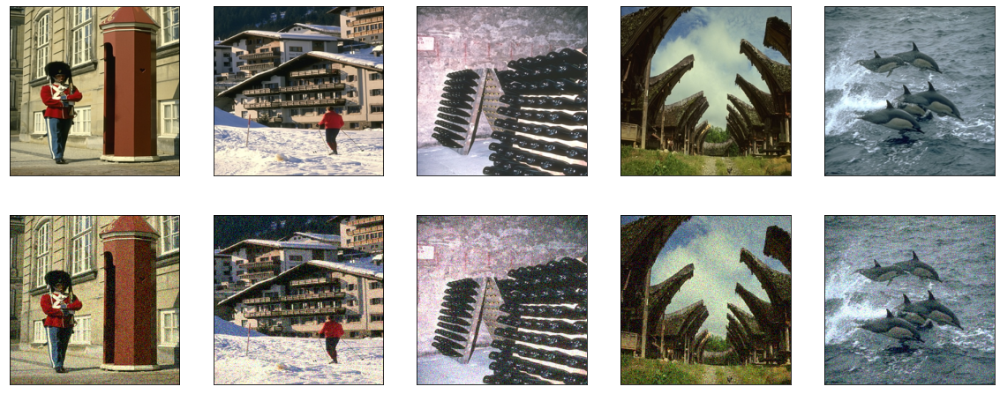

In [ ]:
# use Matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
n = 5
plt.figure(figsize=(20, 8))
for i in range(1,n+1):
 # display original
 ax = plt.subplot(2, n, i )
 plt.imshow(x_train[i].reshape(256, 256,3))
 plt.gray()
 ax.get_xaxis().set_visible(False)
 ax.get_yaxis().set_visible(False)
# display reconstruction
 ax = plt.subplot(2, n, i + n)
 plt.imshow(x_train_noisy[i].reshape(256, 256,3))
 plt.gray()
 ax.get_xaxis().set_visible(False)
 ax.get_yaxis().set_visible(False)
plt.show()

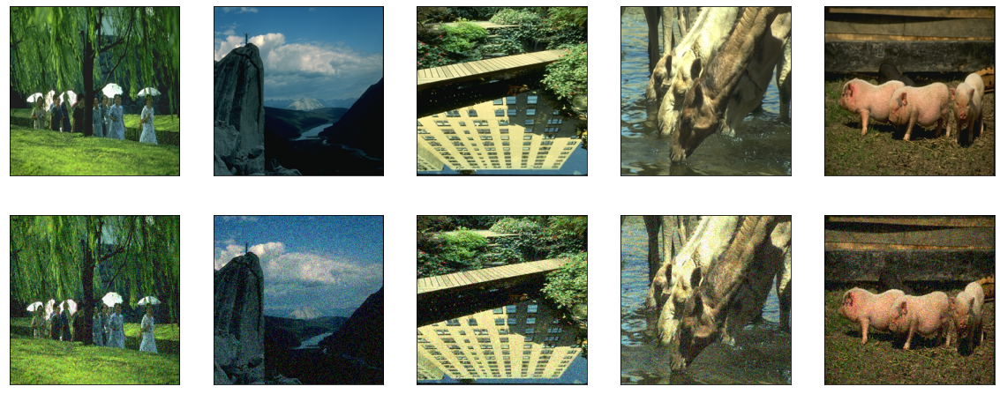

In [ ]:
# use Matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
n = 5
plt.figure(figsize=(20, 8))
for i in range(1,n+1):
 # display original
 ax = plt.subplot(2, n, i )
 plt.imshow(x_test[i].reshape(256, 256,3))
 plt.gray()
 ax.get_xaxis().set_visible(False)
 ax.get_yaxis().set_visible(False)
# display reconstruction
 ax = plt.subplot(2, n, i + n)
 plt.imshow(x_test_noisy[i].reshape(256, 256,3))
 plt.gray()
 ax.get_xaxis().set_visible(False)
 ax.get_yaxis().set_visible(False)
plt.show()

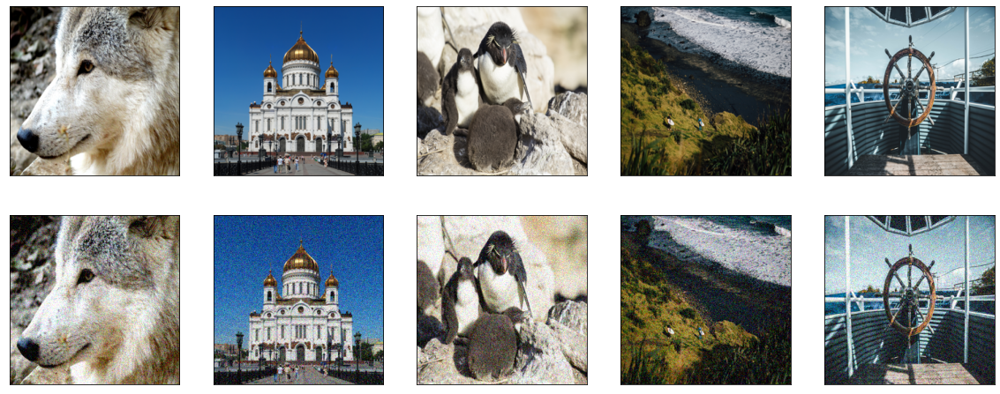

In [ ]:
# use Matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
n = 5
plt.figure(figsize=(20, 8))
for i in range(1,n+1):
 # display original
 ax = plt.subplot(2, n, i )
 plt.imshow(x_Val[i].reshape(256, 256,3))
 plt.gray()
 ax.get_xaxis().set_visible(False)
 ax.get_yaxis().set_visible(False)
# display reconstruction
 ax = plt.subplot(2, n, i + n)
 plt.imshow(x_Val_noisy[i].reshape(256, 256,3))
 plt.gray()
 ax.get_xaxis().set_visible(False)
 ax.get_yaxis().set_visible(False)
plt.show()

In [ ]:
input_img = keras.Input(shape=(256, 256, 3))
f_encod=64
f_decode=32

x = layers.Conv2D(f_encod, (3, 3), activation='relu', padding='same')(input_img)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(f_encod, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(f_encod, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(f_encod, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(f_encod, (3, 3), activation='relu', padding='same',name='encoded')(x)
encoded = x

x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(encoded)
x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
decoded = layers.Conv2D(3, (3, 3), activation='relu', padding='same')(x)


autoencoder = keras.Model(input_img, decoded)
autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate= .001), loss='mean_squared_error')
autoencoder.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 128, 128, 64)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 64)      36928     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 64, 64, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 64)        36928 

In [ ]:
autoencoder.fit(x_train_noisy, x_train,epochs=150,batch_size=64,shuffle=True,validation_data=(x_Val_noisy, x_Val))

Epoch 1/150
4/4 [==============================] - 16s 1s/step - loss: 0.2259 - val_loss: 0.2139
Epoch 2/150
4/4 [==============================] - 2s 373ms/step - loss: 0.1598 - val_loss: 0.1227
Epoch 3/150
4/4 [==============================] - 2s 381ms/step - loss: 0.0992 - val_loss: 0.1116
Epoch 4/150
4/4 [==============================] - 2s 387ms/step - loss: 0.0828 - val_loss: 0.0788
Epoch 5/150
4/4 [==============================] - 2s 380ms/step - loss: 0.0621 - val_loss: 0.0626
Epoch 6/150
4/4 [==============================] - 2s 385ms/step - loss: 0.0505 - val_loss: 0.0562
Epoch 7/150
4/4 [==============================] - 2s 385ms/step - loss: 0.0427 - val_loss: 0.0537
Epoch 8/150
4/4 [==============================] - 2s 383ms/step - loss: 0.0389 - val_loss: 0.0499
Epoch 9/150
4/4 [==============================] - 2s 383ms/step - loss: 0.0362 - val_loss: 0.0460
Epoch 10/150
4/4 [==============================] - 2s 379ms/step - loss: 0.0339 - val_loss: 0.0411
Epoch 11/15

In [ ]:
decoded_clean_imgs = autoencoder.predict(x_test)
decoded_clean_imgs[0].shape

4/4 [==============================] - 0s 88ms/step


(256, 256, 3)

In [ ]:
decoded_noisy_imgs = autoencoder.predict(x_test_noisy)
decoded_noisy_imgs[0].shape

4/4 [==============================] - 0s 69ms/step


(256, 256, 3)

In [ ]:
encoder = keras.Model(input_img, encoded)
encoded_imgs = encoder.predict(x_test_noisy)

4/4 [==============================] - 0s 29ms/step


In [ ]:
encoded_imgs.shape

(100, 16, 16, 64)

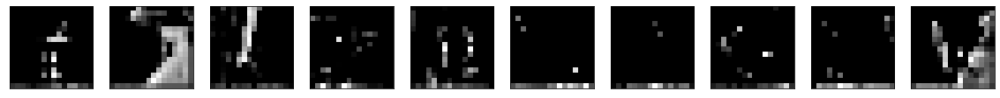

In [ ]:
n = 10
plt.figure(figsize=(20, 8))
for i in range(1, n + 1):
    ax = plt.subplot(1, n, i)
    plt.imshow(encoded_imgs[i,:,:,0].reshape((16, 16)).T)
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

In [ ]:
encoded_input = keras.Input(shape=(16, 16, 64))

x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(encoded_input)
x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
# x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
last = layers.Conv2D(3, (3, 3), activation='relu', padding='same')(x)
decoder = keras.Model(encoded_input, last)
decoder.compile(optimizer='adam', loss='binary_crossentropy')
decoder.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 16, 16, 64)]      0         
                                                                 
 conv2d_transpose_4 (Conv2DT  (None, 32, 32, 32)       18464     
 ranspose)                                                       
                                                                 
 conv2d_transpose_5 (Conv2DT  (None, 64, 64, 32)       9248      
 ranspose)                                                       
                                                                 
 conv2d_transpose_6 (Conv2DT  (None, 128, 128, 32)     9248      
 ranspose)                                                       
                                                                 
 conv2d_transpose_7 (Conv2DT  (None, 256, 256, 32)     9248      
 ranspose)                                                 

In [ ]:
k = 0
for i in range (10,20):
    print(autoencoder.weights[i].shape)

print()
for i in range (0,10):
    print(decoder.weights[i].shape)


for i in range (10,20):
    decoder.weights[k].assign(autoencoder.weights[i])
    k = k+1

(3, 3, 32, 64)
(32,)
(3, 3, 32, 32)
(32,)
(3, 3, 32, 32)
(32,)
(3, 3, 32, 32)
(32,)
(3, 3, 32, 3)
(3,)

(3, 3, 32, 64)
(32,)
(3, 3, 32, 32)
(32,)
(3, 3, 32, 32)
(32,)
(3, 3, 32, 32)
(32,)
(3, 3, 32, 3)
(3,)


In [ ]:
decoded_imgs = decoder.predict(encoded_imgs)

4/4 [==============================] - 0s 49ms/step


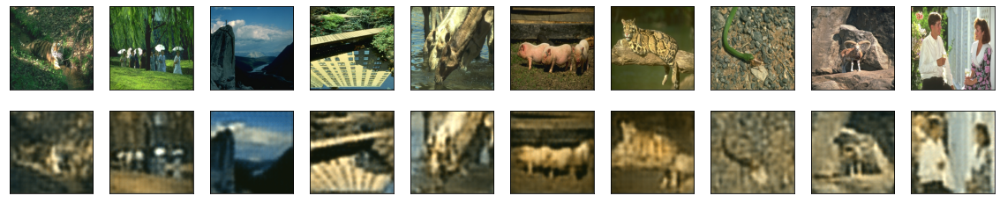

In [ ]:
n = 10  # How many digits we will display
plt.figure(figsize=(20, 4))
for i in range(n):
    # Display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(x_test[i].reshape(256,256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_imgs[i].reshape(256,256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

In [ ]:
fig = plt.figure(figsize=(24, 50))
rows = 10
columns = 5
k = 0

for i in range(0,columns * rows,5):
    fig.add_subplot(rows, columns, i + 1)
    plt.imshow(x_test[k])
    plt.axis('off')

    fig.add_subplot(rows, columns, i + 2)
    plt.imshow(decoded_clean_imgs[k])
    plt.axis('off')


    fig.add_subplot(rows, columns, i + 3)
    plt.imshow(x_test_noisy[k])
    plt.axis('off')

    fig.add_subplot(rows, columns, i + 4)
    plt.imshow(decoded_noisy_imgs[k])
    plt.axis('off')

    fig.add_subplot(rows, columns, i + 5)
    plt.imshow(decoded_imgs[k])
    plt.axis('off')
    k+=1

print('original')
print('decoded_clean_imgs')
print('noise_test')
print('decoded_noise_imgs')
print('decoded_noise_layer')

In [ ]:
img=Image.open('/content/super-resolution-benchmarks/General100/General100/im_005.png')
img = img.convert('RGB')
img=img.resize((256,256))
img=np.array(img)

In [ ]:
img = img.astype(np.float32) / 255.

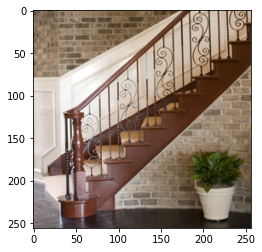

In [ ]:
plt.imshow(img.reshape(256, 256,3))

In [ ]:
img=np.expand_dims(img, 0)
img.shape

(1, 256, 256, 3)

In [ ]:
# noise_factor = .3
img_noisy = img +  np.random.normal(loc=0, scale=.09, size=img.shape)

In [ ]:
img_noisy.shape

(1, 256, 256, 3)

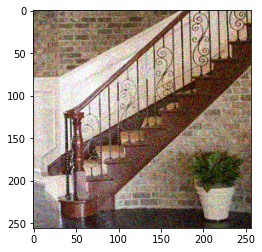

In [ ]:
plt.imshow(img_noisy.reshape(256, 256,3))

In [ ]:
decoded_clean_img = autoencoder.predict(img)
decoded_clean_img.shape

1/1 [==============================] - 0s 324ms/step


(1, 256, 256, 3)

In [ ]:
decoded_noisy_img = autoencoder.predict(img_noisy)
decoded_noisy_img[0].shape

1/1 [==============================] - 0s 18ms/step


(256, 256, 3)

In [ ]:
encoded_img = encoder.predict(img_noisy)

1/1 [==============================] - 0s 15ms/step


In [ ]:
encoded_img.shape

(1, 16, 16, 64)

In [ ]:
decoded_img = decoder.predict(encoded_img)

1/1 [==============================] - 0s 13ms/step


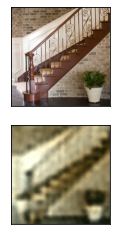

In [ ]:
n = 1  # How many digits we will display
plt.figure(figsize=(20, 4))
for i in range(n):
    # Display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(img.reshape(256,256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_img.reshape(256,256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

original
decoded_clean_imgs
noise_test
decoded_noise_imgs
decoded_noise_layer


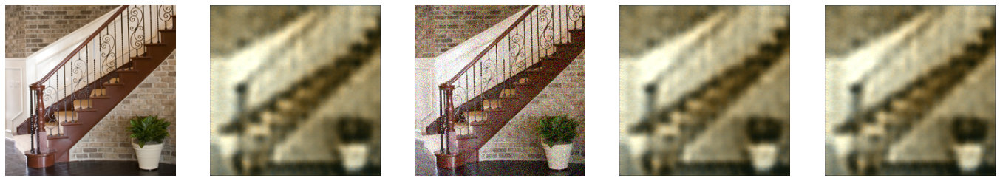

In [ ]:
fig = plt.figure(figsize=(24, 50))
rows = 1
columns = 5
k = 0

for i in range(0,columns * rows,5):
    fig.add_subplot(rows, columns, i + 1)
    plt.imshow(img.reshape(256,256,3))
    plt.axis('off')

    fig.add_subplot(rows, columns, i + 2)
    plt.imshow(decoded_clean_img.reshape(256,256,3))
    plt.axis('off')


    fig.add_subplot(rows, columns, i + 3)
    plt.imshow(img_noisy.reshape(256,256,3))
    plt.axis('off')

    fig.add_subplot(rows, columns, i + 4)
    plt.imshow(decoded_noisy_img.reshape(256,256,3))
    plt.axis('off')

    fig.add_subplot(rows, columns, i + 5)
    plt.imshow(decoded_img.reshape(256,256,3))
    plt.axis('off')
    k+=1

print('original')
print('decoded_clean_imgs')
print('noise_test')
print('decoded_noise_imgs')
print('decoded_noise_layer')

In [ ]:
input_img = keras.Input(shape=(256, 256, 3))
f_encod=128
f_decode=64

x = layers.Conv2D(f_encod, (3, 3), activation='relu', padding='same')(input_img)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(f_encod, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(f_encod, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
# x = layers.Conv2D(f_encod, (3, 3), activation='relu', padding='same')(x)
# x = layers.MaxPooling2D((2, 2), padding='same')(x)
# x = layers.Conv2D(f_encod, (3, 3), activation='relu', padding='same')(x)
# x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(f_encod, (3, 3), activation='relu', padding='same',name='encoded')(x)
encoded = x

x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(encoded)
x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
# x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
# x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
decoded = layers.Conv2D(3, (3, 3), activation='relu', padding='same')(x)


autoencoder = keras.Model(input_img, decoded)
autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate= .001), loss='mean_squared_error')
autoencoder.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_6 (Conv2D)           (None, 256, 256, 128)     3584      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 128, 128, 128)    0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 128, 128, 128)     147584    
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 64, 64, 128)      0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 64, 64, 128)       1475

In [ ]:
autoencoder.fit(x_train_noisy, x_train,epochs=150,batch_size=64,shuffle=True,validation_data=(x_Val_noisy, x_Val))

Epoch 1/150
4/4 [==============================] - 15s 2s/step - loss: 0.2192 - val_loss: 0.1269
Epoch 2/150
4/4 [==============================] - 3s 771ms/step - loss: 0.1169 - val_loss: 0.1063
Epoch 3/150
4/4 [==============================] - 3s 770ms/step - loss: 0.0763 - val_loss: 0.0916
Epoch 4/150
4/4 [==============================] - 3s 767ms/step - loss: 0.0554 - val_loss: 0.0606
Epoch 5/150
4/4 [==============================] - 3s 769ms/step - loss: 0.0414 - val_loss: 0.0500
Epoch 6/150
4/4 [==============================] - 3s 755ms/step - loss: 0.0338 - val_loss: 0.0430
Epoch 7/150
4/4 [==============================] - 3s 756ms/step - loss: 0.0297 - val_loss: 0.0367
Epoch 8/150
4/4 [==============================] - 3s 751ms/step - loss: 0.0258 - val_loss: 0.0302
Epoch 9/150
4/4 [==============================] - 3s 750ms/step - loss: 0.0233 - val_loss: 0.0322
Epoch 10/150
4/4 [==============================] - 3s 749ms/step - loss: 0.0228 - val_loss: 0.0297
Epoch 11/15

In [ ]:
decoded_clean_imgs = autoencoder.predict(x_test)
decoded_clean_imgs[0].shape

4/4 [==============================] - 3s 269ms/step


(256, 256, 3)

In [ ]:
decoded_noisy_imgs = autoencoder.predict(x_test_noisy)
decoded_noisy_imgs[0].shape

4/4 [==============================] - 1s 162ms/step


(256, 256, 3)

In [ ]:
encoder = keras.Model(input_img, encoded)
encoded_imgs = encoder.predict(x_test_noisy)

4/4 [==============================] - 0s 70ms/step


In [ ]:
encoded_imgs.shape

(100, 32, 32, 128)

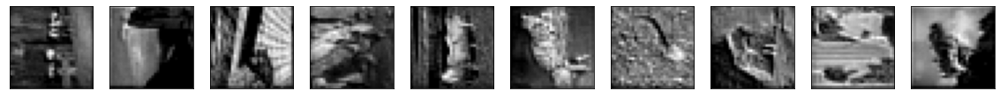

In [ ]:
n = 10
plt.figure(figsize=(20, 8))
for i in range(1, n + 1):
    ax = plt.subplot(1, n, i)
    plt.imshow(encoded_imgs[i,:,:,0].reshape((32, 32)).T)
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

In [ ]:
encoded_input = keras.Input(shape=(32, 32, 128))


x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(encoded_input)
x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
# x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
# x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
# x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
last = layers.Conv2D(3, (3, 3), activation='relu', padding='same')(x)
decoder = keras.Model(encoded_input, last)
decoder.compile(optimizer='adam', loss='binary_crossentropy')
decoder.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 32, 32, 128)]     0         
                                                                 
 conv2d_transpose_11 (Conv2D  (None, 64, 64, 64)       73792     
 Transpose)                                                      
                                                                 
 conv2d_transpose_12 (Conv2D  (None, 128, 128, 64)     36928     
 Transpose)                                                      
                                                                 
 conv2d_transpose_13 (Conv2D  (None, 256, 256, 64)     36928     
 Transpose)                                                      
                                                                 
 conv2d_10 (Conv2D)          (None, 256, 256, 3)       1731      
                                                           

In [ ]:
k = 0
for i in range (8,16):
    print(autoencoder.weights[i].shape)

print()
for i in range (0,8):
    print(decoder.weights[i].shape)


for i in range (8,16):
    decoder.weights[k].assign(autoencoder.weights[i])
    k = k+1

(3, 3, 64, 128)
(64,)
(3, 3, 64, 64)
(64,)
(3, 3, 64, 64)
(64,)
(3, 3, 64, 3)
(3,)

(3, 3, 64, 128)
(64,)
(3, 3, 64, 64)
(64,)
(3, 3, 64, 64)
(64,)
(3, 3, 64, 3)
(3,)


In [ ]:
decoded_imgs = decoder.predict(encoded_imgs)

4/4 [==============================] - 0s 99ms/step


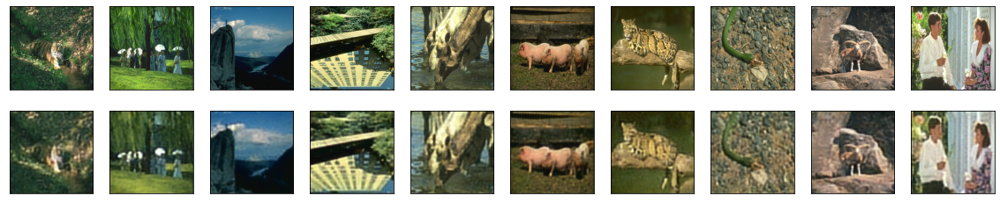

In [ ]:
n = 10  # How many digits we will display
plt.figure(figsize=(20, 4))
for i in range(n):
    # Display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(x_test[i].reshape(256,256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_imgs[i].reshape(256,256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

In [ ]:
fig = plt.figure(figsize=(24, 50))
rows = 10
columns = 5
k = 0

for i in range(0,columns * rows,5):
    fig.add_subplot(rows, columns, i + 1)
    plt.imshow(x_test[k])
    plt.axis('off')

    fig.add_subplot(rows, columns, i + 2)
    plt.imshow(decoded_clean_imgs[k])
    plt.axis('off')


    fig.add_subplot(rows, columns, i + 3)
    plt.imshow(x_test_noisy[k])
    plt.axis('off')

    fig.add_subplot(rows, columns, i + 4)
    plt.imshow(decoded_noisy_imgs[k])
    plt.axis('off')

    fig.add_subplot(rows, columns, i + 5)
    plt.imshow(decoded_imgs[k])
    plt.axis('off')
    k+=1

print('original')
print('decoded_clean_imgs')
print('noise_test')
print('decoded_noise_imgs')
print('decoded_noise_layer')

In [ ]:
img=Image.open('/content/super-resolution-benchmarks/General100/General100/im_005.png')
img = img.convert('RGB')
img=img.resize((256,256))
img=np.array(img)

In [ ]:
img = img.astype(np.float32) / 255.

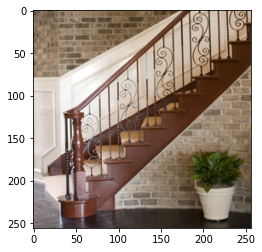

In [ ]:
plt.imshow(img.reshape(256, 256,3))

In [ ]:
img=np.expand_dims(img, 0)
img.shape

(1, 256, 256, 3)

In [ ]:
# noise_factor = .3
img_noisy = img +  np.random.normal(loc=0, scale=.09, size=img.shape)

In [ ]:
img_noisy.shape

(1, 256, 256, 3)

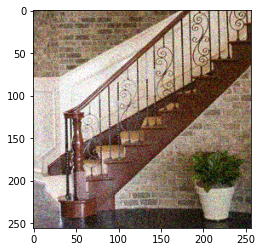

In [ ]:
plt.imshow(img_noisy.reshape(256, 256,3))

In [ ]:
decoded_clean_img = autoencoder.predict(img)
decoded_clean_img.shape

1/1 [==============================] - 0s 361ms/step


(1, 256, 256, 3)

In [ ]:
decoded_noisy_img = autoencoder.predict(img_noisy)
decoded_noisy_img[0].shape

1/1 [==============================] - 0s 16ms/step


(256, 256, 3)

In [ ]:
encoded_img = encoder.predict(img_noisy)

1/1 [==============================] - 0s 13ms/step


In [ ]:
encoded_img.shape

(1, 32, 32, 128)

In [ ]:
decoded_img = decoder.predict(encoded_img)

1/1 [==============================] - 0s 15ms/step


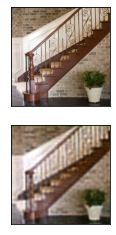

In [ ]:
n = 1  # How many digits we will display
plt.figure(figsize=(20, 4))
for i in range(n):
    # Display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(img.reshape(256,256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_img.reshape(256,256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

original
decoded_clean_imgs
noise_test
decoded_noise_imgs
decoded_noise_layer


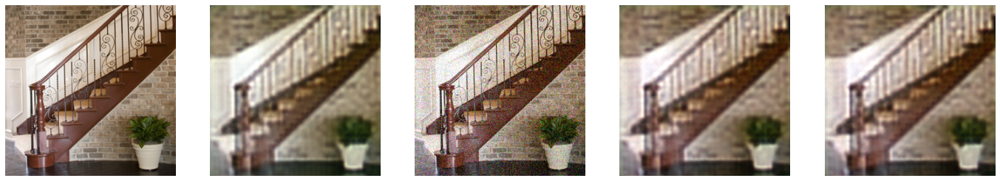

In [ ]:
fig = plt.figure(figsize=(24, 50))
rows = 1
columns = 5
k = 0

for i in range(0,columns * rows,5):
    fig.add_subplot(rows, columns, i + 1)
    plt.imshow(img.reshape(256,256,3))
    plt.axis('off')

    fig.add_subplot(rows, columns, i + 2)
    plt.imshow(decoded_clean_img.reshape(256,256,3))
    plt.axis('off')


    fig.add_subplot(rows, columns, i + 3)
    plt.imshow(img_noisy.reshape(256,256,3))
    plt.axis('off')

    fig.add_subplot(rows, columns, i + 4)
    plt.imshow(decoded_noisy_img.reshape(256,256,3))
    plt.axis('off')

    fig.add_subplot(rows, columns, i + 5)
    plt.imshow(decoded_img.reshape(256,256,3))
    plt.axis('off')
    k+=1

print('original')
print('decoded_clean_imgs')
print('noise_test')
print('decoded_noise_imgs')
print('decoded_noise_layer')

In [ ]:
input_img = keras.Input(shape=(256, 256, 3))
f_encod=64
f_decode=32

x = layers.Conv2D(f_encod, (3, 3), activation='relu', padding='same')(input_img)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(f_encod, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(f_encod, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(f_encod, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(f_encod, (3, 3), activation='relu', padding='same',name='encoded')(x)
encoded = x

x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(encoded)
x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
decoded = layers.Conv2D(3, (3, 3), activation='relu', padding='same')(x)


autoencoder = keras.Model(input_img, decoded)
autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate= .001), loss='mean_squared_error')
autoencoder.summary()

Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_11 (Conv2D)          (None, 256, 256, 64)      1792      
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 128, 128, 64)     0         
 2D)                                                             
                                                                 
 conv2d_12 (Conv2D)          (None, 128, 128, 64)      36928     
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 64, 64, 64)       0         
 2D)                                                             
                                                                 
 conv2d_13 (Conv2D)          (None, 64, 64, 64)        3692

In [ ]:
autoencoder.fit(x_train, x_train,epochs=150,batch_size=64,shuffle=True,validation_data=(x_Val, x_Val))

Epoch 1/150
4/4 [==============================] - 3s 477ms/step - loss: 0.2258 - val_loss: 0.2099
Epoch 2/150
4/4 [==============================] - 2s 386ms/step - loss: 0.1559 - val_loss: 0.1250
Epoch 3/150
4/4 [==============================] - 2s 394ms/step - loss: 0.0992 - val_loss: 0.0957
Epoch 4/150
4/4 [==============================] - 2s 394ms/step - loss: 0.0711 - val_loss: 0.0769
Epoch 5/150
4/4 [==============================] - 2s 398ms/step - loss: 0.0545 - val_loss: 0.0603
Epoch 6/150
4/4 [==============================] - 2s 392ms/step - loss: 0.0466 - val_loss: 0.0530
Epoch 7/150
4/4 [==============================] - 2s 394ms/step - loss: 0.0409 - val_loss: 0.0486
Epoch 8/150
4/4 [==============================] - 2s 399ms/step - loss: 0.0364 - val_loss: 0.0454
Epoch 9/150
4/4 [==============================] - 2s 398ms/step - loss: 0.0339 - val_loss: 0.0440
Epoch 10/150
4/4 [==============================] - 2s 395ms/step - loss: 0.0316 - val_loss: 0.0410
Epoch 11/

In [ ]:
decoded_clean_imgs = autoencoder.predict(x_test)
decoded_clean_imgs[0].shape

4/4 [==============================] - 0s 84ms/step


(256, 256, 3)

In [ ]:
decoded_noisy_imgs = autoencoder.predict(x_test_noisy)
decoded_noisy_imgs[0].shape

4/4 [==============================] - 0s 69ms/step


(256, 256, 3)

In [ ]:
encoder = keras.Model(input_img, encoded)
encoded_imgs = encoder.predict(x_test)

4/4 [==============================] - 0s 29ms/step


In [ ]:
encoded_imgs.shape

(100, 16, 16, 64)

In [ ]:
encoded_noisy_imgs = encoded_imgs + np.random.normal(loc=0, scale=.09, size=encoded_imgs.shape)

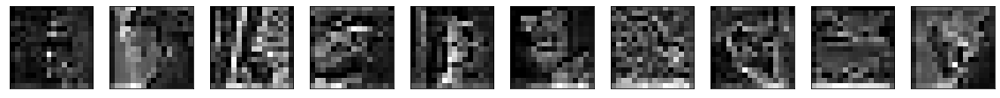

In [ ]:
n = 10
plt.figure(figsize=(20, 8))
for i in range(1, n + 1):
    ax = plt.subplot(1, n, i)
    plt.imshow(encoded_imgs[i,:,:,0].reshape((16, 16)).T)
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

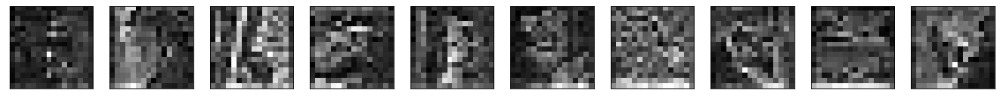

In [ ]:
n = 10
plt.figure(figsize=(20, 8))
for i in range(1, n + 1):
    ax = plt.subplot(1, n, i)
    plt.imshow(encoded_noisy_imgs[i,:,:,0].reshape((16, 16)).T)
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

In [ ]:
encoded_input = keras.Input(shape=(16, 16, 64))

x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(encoded_input)
x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
# x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
last = layers.Conv2D(3, (3, 3), activation='relu', padding='same')(x)
decoder = keras.Model(encoded_input, last)
decoder.compile(optimizer='adam', loss='binary_crossentropy')
decoder.summary()

Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 16, 16, 64)]      0         
                                                                 
 conv2d_transpose_18 (Conv2D  (None, 32, 32, 32)       18464     
 Transpose)                                                      
                                                                 
 conv2d_transpose_19 (Conv2D  (None, 64, 64, 32)       9248      
 Transpose)                                                      
                                                                 
 conv2d_transpose_20 (Conv2D  (None, 128, 128, 32)     9248      
 Transpose)                                                      
                                                                 
 conv2d_transpose_21 (Conv2D  (None, 256, 256, 32)     9248      
 Transpose)                                                

In [ ]:
k = 0
for i in range (10,20):
    print(autoencoder.weights[i].shape)

print()
for i in range (0,10):
    print(decoder.weights[i].shape)


for i in range (10,20):
    decoder.weights[k].assign(autoencoder.weights[i])
    k = k+1

(3, 3, 32, 64)
(32,)
(3, 3, 32, 32)
(32,)
(3, 3, 32, 32)
(32,)
(3, 3, 32, 32)
(32,)
(3, 3, 32, 3)
(3,)

(3, 3, 32, 64)
(32,)
(3, 3, 32, 32)
(32,)
(3, 3, 32, 32)
(32,)
(3, 3, 32, 32)
(32,)
(3, 3, 32, 3)
(3,)


In [ ]:
decoded_imgs = decoder.predict(encoded_noisy_imgs)

4/4 [==============================] - 0s 51ms/step


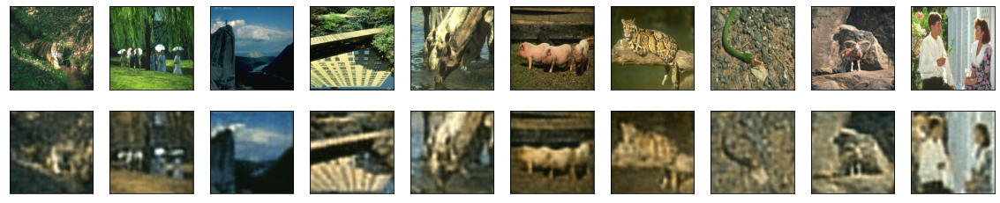

In [ ]:
n = 10  # How many digits we will display
plt.figure(figsize=(20, 4))
for i in range(n):
    # Display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(x_test[i].reshape(256,256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_imgs[i].reshape(256,256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

In [ ]:
fig = plt.figure(figsize=(24, 50))
rows = 10
columns = 5
k = 0

for i in range(0,columns * rows,5):
    fig.add_subplot(rows, columns, i + 1)
    plt.imshow(x_test[k])
    plt.axis('off')

    fig.add_subplot(rows, columns, i + 2)
    plt.imshow(decoded_clean_imgs[k])
    plt.axis('off')


    fig.add_subplot(rows, columns, i + 3)
    plt.imshow(x_test_noisy[k])
    plt.axis('off')

    fig.add_subplot(rows, columns, i + 4)
    plt.imshow(decoded_noisy_imgs[k])
    plt.axis('off')

    fig.add_subplot(rows, columns, i + 5)
    plt.imshow(decoded_imgs[k])
    plt.axis('off')
    k+=1

print('original')
print('decoded_clean_imgs')
print('noise_test')
print('decoded_noise_imgs')
print('decoded_noise_layer')

In [ ]:
img=Image.open('/content/super-resolution-benchmarks/General100/General100/im_005.png')
img = img.convert('RGB')
img=img.resize((256,256))
img=np.array(img)

In [ ]:
img = img.astype(np.float32) / 255.

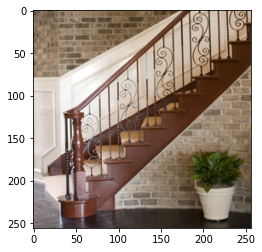

In [ ]:
plt.imshow(img.reshape(256, 256,3))

In [ ]:
img=np.expand_dims(img, 0)
img.shape

(1, 256, 256, 3)

In [ ]:
img_noisy = img +  np.random.normal(loc=0, scale=.09, size=img.shape)

In [ ]:
decoded_clean_img = autoencoder.predict(img)
decoded_clean_img.shape

1/1 [==============================] - 0s 16ms/step


(1, 256, 256, 3)

In [ ]:
decoded_noisy_img = autoencoder.predict(img_noisy)
decoded_noisy_img[0].shape

1/1 [==============================] - 0s 15ms/step


(256, 256, 3)

In [ ]:
encoded_img = encoder.predict(img)

1/1 [==============================] - 0s 15ms/step


In [ ]:
# noise_factor = .3
encoded_noisy_img = encoded_img +  np.random.normal(loc=0, scale=.09, size=encoded_img.shape)

In [ ]:
encoded_img.shape

(1, 16, 16, 64)

In [ ]:
decoded_img = decoder.predict(encoded_noisy_img)

1/1 [==============================] - 0s 15ms/step


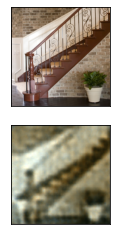

In [ ]:
n = 1  # How many digits we will display
plt.figure(figsize=(20, 4))
for i in range(n):
    # Display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(img.reshape(256,256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_img.reshape(256,256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

original
decoded_clean_imgs
noise_test
decoded_noise_imgs
decoded_noise_layer


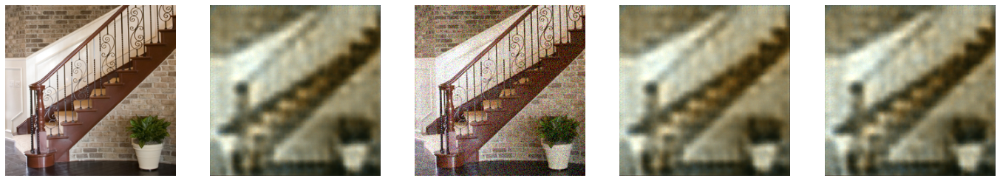

In [ ]:
fig = plt.figure(figsize=(24, 50))
rows = 1
columns = 5
k = 0

for i in range(0,columns * rows,5):
    fig.add_subplot(rows, columns, i + 1)
    plt.imshow(img.reshape(256,256,3))
    plt.axis('off')

    fig.add_subplot(rows, columns, i + 2)
    plt.imshow(decoded_clean_img.reshape(256,256,3))
    plt.axis('off')


    fig.add_subplot(rows, columns, i + 3)
    plt.imshow(img_noisy.reshape(256,256,3))
    plt.axis('off')

    fig.add_subplot(rows, columns, i + 4)
    plt.imshow(decoded_noisy_img.reshape(256,256,3))
    plt.axis('off')

    fig.add_subplot(rows, columns, i + 5)
    plt.imshow(decoded_img.reshape(256,256,3))
    plt.axis('off')
    k+=1

print('original')
print('decoded_clean_imgs')
print('noise_test')
print('decoded_noise_imgs')
print('decoded_noise_layer')

In [ ]:
input_img = keras.Input(shape=(256, 256, 3))
f_encod=128
f_decode=64

x = layers.Conv2D(f_encod, (3, 3), activation='relu', padding='same')(input_img)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(f_encod, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(f_encod, (3, 3), activation='relu', padding='same')(x)
x = layers.MaxPooling2D((2, 2), padding='same')(x)
# x = layers.Conv2D(f_encod, (3, 3), activation='relu', padding='same')(x)
# x = layers.MaxPooling2D((2, 2), padding='same')(x)
# x = layers.Conv2D(f_encod, (3, 3), activation='relu', padding='same')(x)
# x = layers.MaxPooling2D((2, 2), padding='same')(x)
x = layers.Conv2D(f_encod, (3, 3), activation='relu', padding='same',name='encoded')(x)
encoded = x

x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(encoded)
x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
# x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
# x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
decoded = layers.Conv2D(3, (3, 3), activation='relu', padding='same')(x)


autoencoder = keras.Model(input_img, decoded)
autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate= .001), loss='mean_squared_error')
autoencoder.summary()

Model: "model_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_17 (Conv2D)          (None, 256, 256, 128)     3584      
                                                                 
 max_pooling2d_11 (MaxPoolin  (None, 128, 128, 128)    0         
 g2D)                                                            
                                                                 
 conv2d_18 (Conv2D)          (None, 128, 128, 128)     147584    
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 64, 64, 128)      0         
 g2D)                                                            
                                                                 
 conv2d_19 (Conv2D)          (None, 64, 64, 128)       147

In [ ]:
autoencoder.fit(x_train, x_train,epochs=150,batch_size=64,shuffle=True,validation_data=(x_Val, x_Val))

Epoch 1/150
4/4 [==============================] - 4s 824ms/step - loss: 0.2095 - val_loss: 0.2632
Epoch 2/150
4/4 [==============================] - 3s 746ms/step - loss: 0.1248 - val_loss: 0.1230
Epoch 3/150
4/4 [==============================] - 3s 754ms/step - loss: 0.0934 - val_loss: 0.0615
Epoch 4/150
4/4 [==============================] - 3s 757ms/step - loss: 0.0600 - val_loss: 0.0503
Epoch 5/150
4/4 [==============================] - 3s 758ms/step - loss: 0.0433 - val_loss: 0.0471
Epoch 6/150
4/4 [==============================] - 3s 767ms/step - loss: 0.0340 - val_loss: 0.0446
Epoch 7/150
4/4 [==============================] - 3s 756ms/step - loss: 0.0309 - val_loss: 0.0389
Epoch 8/150
4/4 [==============================] - 3s 766ms/step - loss: 0.0284 - val_loss: 0.0365
Epoch 9/150
4/4 [==============================] - 3s 751ms/step - loss: 0.0263 - val_loss: 0.0349
Epoch 10/150
4/4 [==============================] - 3s 751ms/step - loss: 0.0240 - val_loss: 0.0301
Epoch 11/

In [ ]:
decoded_clean_imgs = autoencoder.predict(x_test)
decoded_clean_imgs[0].shape

4/4 [==============================] - 1s 147ms/step


(256, 256, 3)

In [ ]:
decoded_noisy_imgs = autoencoder.predict(x_test_noisy)
decoded_noisy_imgs[0].shape

4/4 [==============================] - 1s 159ms/step


(256, 256, 3)

In [ ]:
encoder = keras.Model(input_img, encoded)
encoded_imgs = encoder.predict(x_test)

4/4 [==============================] - 0s 70ms/step


In [ ]:
encoded_imgs.shape

(100, 32, 32, 128)

In [ ]:
encoded_noisy_imgs = encoded_imgs +  np.random.normal(loc=0, scale=.09, size=encoded_imgs.shape)

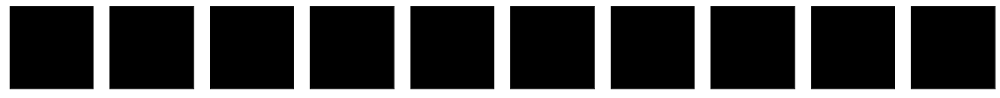

In [ ]:
n = 10
plt.figure(figsize=(20, 8))
for i in range(1, n + 1):
    ax = plt.subplot(1, n, i)
    plt.imshow(encoded_imgs[i,:,:,0].reshape((32, 32)).T)
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

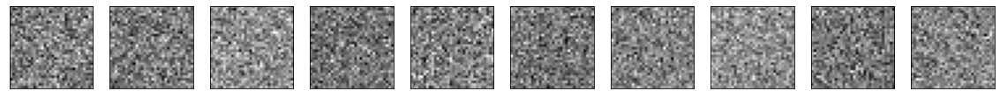

In [ ]:
n = 10
plt.figure(figsize=(20, 8))
for i in range(1, n + 1):
    ax = plt.subplot(1, n, i)
    plt.imshow(encoded_noisy_imgs[i,:,:,0].reshape((32, 32)).T)
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

In [ ]:
encoded_input = keras.Input(shape=(32, 32, 128))

x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(encoded_input)
x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
# x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
# x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
# x = layers.Conv2DTranspose(f_decode, (3, 3), strides=(2,2), activation='relu', padding='same')(x)
last = layers.Conv2D(3, (3, 3), activation='relu', padding='same')(x)
decoder = keras.Model(encoded_input, last)
decoder.compile(optimizer='adam', loss='binary_crossentropy')
decoder.summary()

Model: "model_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 32, 32, 128)]     0         
                                                                 
 conv2d_transpose_25 (Conv2D  (None, 64, 64, 64)       73792     
 Transpose)                                                      
                                                                 
 conv2d_transpose_26 (Conv2D  (None, 128, 128, 64)     36928     
 Transpose)                                                      
                                                                 
 conv2d_transpose_27 (Conv2D  (None, 256, 256, 64)     36928     
 Transpose)                                                      
                                                                 
 conv2d_21 (Conv2D)          (None, 256, 256, 3)       1731      
                                                          

In [ ]:
k = 0
for i in range (8,16):
    print(autoencoder.weights[i].shape)

print()
for i in range (0,8):
    print(decoder.weights[i].shape)


for i in range (8,16):
    decoder.weights[k].assign(autoencoder.weights[i])
    k = k+1

(3, 3, 64, 128)
(64,)
(3, 3, 64, 64)
(64,)
(3, 3, 64, 64)
(64,)
(3, 3, 64, 3)
(3,)

(3, 3, 64, 128)
(64,)
(3, 3, 64, 64)
(64,)
(3, 3, 64, 64)
(64,)
(3, 3, 64, 3)
(3,)


In [ ]:
decoded_imgs = decoder.predict(encoded_noisy_imgs)

4/4 [==============================] - 0s 98ms/step


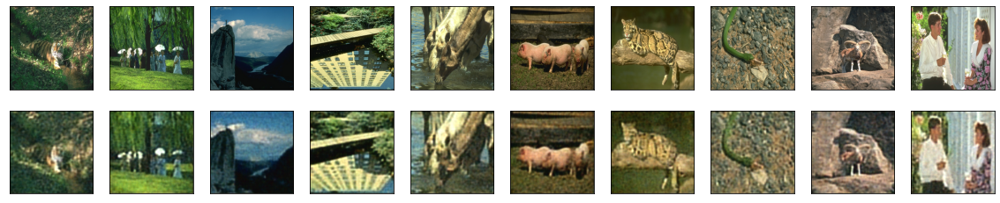

In [ ]:
n = 10  # How many digits we will display
plt.figure(figsize=(20, 4))
for i in range(n):
    # Display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(x_test[i].reshape(256,256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_imgs[i].reshape(256,256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

In [ ]:
fig = plt.figure(figsize=(24, 50))
rows = 10
columns = 5
k = 0

for i in range(0,columns * rows,5):
    fig.add_subplot(rows, columns, i + 1)
    plt.imshow(x_test[k])
    plt.axis('off')

    fig.add_subplot(rows, columns, i + 2)
    plt.imshow(decoded_clean_imgs[k])
    plt.axis('off')


    fig.add_subplot(rows, columns, i + 3)
    plt.imshow(x_test_noisy[k])
    plt.axis('off')

    fig.add_subplot(rows, columns, i + 4)
    plt.imshow(decoded_noisy_imgs[k])
    plt.axis('off')

    fig.add_subplot(rows, columns, i + 5)
    plt.imshow(decoded_imgs[k])
    plt.axis('off')
    k+=1

print('original')
print('decoded_clean_imgs')
print('noise_test')
print('decoded_noise_imgs')
print('decoded_noise_layer')

In [ ]:
img=Image.open('/content/super-resolution-benchmarks/General100/General100/im_005.png')
img = img.convert('RGB')
img=img.resize((256,256))
img=np.array(img)

In [ ]:
img = img.astype(np.float32) / 255.

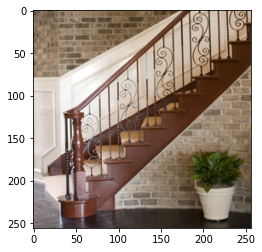

In [ ]:
plt.imshow(img.reshape(256, 256,3))

In [ ]:
img=np.expand_dims(img, 0)
img.shape

(1, 256, 256, 3)

In [ ]:
# noise_factor = .3
img_noisy = img +  np.random.normal(loc=0, scale=.09, size=img.shape)

In [ ]:
img_noisy.shape

(1, 256, 256, 3)

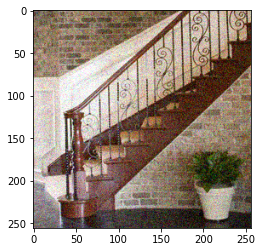

In [ ]:
plt.imshow(img_noisy.reshape(256, 256,3))

In [ ]:
decoded_clean_img = autoencoder.predict(img)
decoded_clean_img.shape

1/1 [==============================] - 0s 16ms/step


(1, 256, 256, 3)

In [ ]:
decoded_noisy_img = autoencoder.predict(img_noisy)
decoded_noisy_img[0].shape

1/1 [==============================] - 0s 14ms/step


(256, 256, 3)

In [ ]:
encoded_img = encoder.predict(img)

1/1 [==============================] - 0s 14ms/step


In [ ]:
encoded_img.shape

(1, 32, 32, 128)

In [ ]:
encoded_noisy_img = encoded_img +  np.random.normal(loc=0, scale=.09, size=encoded_img.shape)

In [ ]:
decoded_img = decoder.predict(encoded_noisy_img)

1/1 [==============================] - 0s 17ms/step


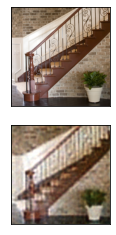

In [ ]:
n = 1  # How many digits we will display
plt.figure(figsize=(20, 4))
for i in range(n):
    # Display original
    ax = plt.subplot(2, n, i + 1)
    plt.imshow(img.reshape(256,256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    # Display reconstruction
    ax = plt.subplot(2, n, i + 1 + n)
    plt.imshow(decoded_img.reshape(256,256,3))
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

original
decoded_clean_imgs
noise_test
decoded_noise_imgs
decoded_noise_layer


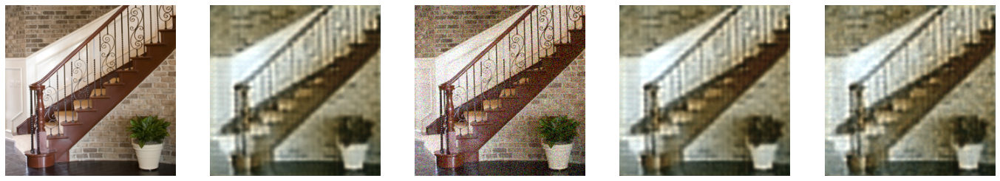

In [ ]:
fig = plt.figure(figsize=(24, 50))
rows = 1
columns = 5
k = 0

for i in range(0,columns * rows,5):
    fig.add_subplot(rows, columns, i + 1)
    plt.imshow(img.reshape(256,256,3))
    plt.axis('off')

    fig.add_subplot(rows, columns, i + 2)
    plt.imshow(decoded_clean_img.reshape(256,256,3))
    plt.axis('off')


    fig.add_subplot(rows, columns, i + 3)
    plt.imshow(img_noisy.reshape(256,256,3))
    plt.axis('off')

    fig.add_subplot(rows, columns, i + 4)
    plt.imshow(decoded_noisy_img.reshape(256,256,3))
    plt.axis('off')

    fig.add_subplot(rows, columns, i + 5)
    plt.imshow(decoded_img.reshape(256,256,3))
    plt.axis('off')
    k+=1

print('original')
print('decoded_clean_imgs')
print('noise_test')
print('decoded_noise_imgs')
print('decoded_noise_layer')